# Исследование рынка заведений общественного питания Москвы

Для анализа предоставлены открытые данные с заведениями общественного питания Москвы, полученные на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть предобавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. необходимо проанализировать ситуацию на рынке общественного питания г. Москвы. 

Цель проекта

    Провести общий анализ рынка, выявить потенциально прибыльные категории заведений, особенности работы 
    и местоположения.
    Провести детализированное исследование кофеен.

Входные данные

    данные о заведениях общественного питания Москвы (файл /datasets/moscow_places.csv)

Ход исследования:

    Обзор данных;
    Предобработка данных;
    Анализ данных
    Выводы по общему анализу;
    Детализированное исследование: открытие кофейни;
    Выводы и рекоммендации;
    Презентация 



Cсылка на презентацию https://cloud.mail.ru/public/idrp/3JuxybZoG

## Обзор данных

In [1]:
#импорт библиотек
import pandas as pd
import os
from math import radians, cos, sin, asin, sqrt 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import kaleido
from plotly import graph_objects as go
import plotly.express as px
import plotly.io as pio
import numpy as np
from numpy import mean
import json
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth

In [2]:
#Настройка отображения данных
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
sns.set_palette('coolwarm')
pio.renderers.default = "png"

Функция `description` на вход получает имя таблицы и количество наблюдений, которые нужно вывести для ознакомления. На выходе вернёт случайно выбранные наблюдения, таблицу с постолбцовым описанием данных, диапазон индексов и общее число записей таблицы.

In [3]:
def description(data, ns): 
    descripted_data = pd.DataFrame({'Наблюдений': data.count(),
                                    'Уникальных значений': data.nunique(),
                                    'Пропусков': data.isna().sum(), 
                                    'Доля пропусков': round(data.isna().sum() / len(data), 2), 
                                    'Тип данных': data.dtypes})
    display(data.sample(ns).T)
    display(descripted_data)
    print(f'Диапазон индексов таблицы: {data.index.min()} - {data.index.max()}')
    print(f'Количестов записей в таблице: {len(data)}')
    print(f'Количество строк-дубликатов: {data.duplicated().sum()}')
    print("Доля дубликатов:{0:.3f}".format(data.duplicated().sum()/ len(data)))
    return


Загружаем данные

In [4]:
pth1 = 'moscow_places.csv'
pth2 = '/datasets/moscow_places.csv'

if os.path.exists(pth1):
    data = pd.read_csv(pth1)
elif os.path.exists(pth2):
    data = pd.read_csv(pth2)
else:
    print('Something is wrong')

Загружаем json файл с границами округов Москвы

In [5]:
pth1 = 'admin_level_geomap.geojson'
pth2 = '/datasets/admin_level_geomap.geojson'

if os.path.exists(pth1):
    with open(pth1, 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
elif os.path.exists(pth2):
    with open(pth2, 'r', encoding='utf-8') as f:
        state_geo = json.load(f)
else:
    print('Something is wrong')

In [6]:
description(data, 7)

,1778,3879,1522,5701,4029,5199,2641
name,Триумф,Тинатин,Теремок,Шоколадница,АВ Гранд-кафе,Глинтвейн,Янис
category,ресторан,ресторан,ресторан,кофейня,ресторан,"бар,паб",ресторан
address,"Москва, Новослободская улица, 54/56","Москва, улица Плющиха, 58, стр. 1А","Москва, площадь Ганецкого, 1Б","Москва, Можайское шоссе, 30","Москва, улица Арбат, 54/2с6","Москва, Михайловский проезд, 1, стр. 1","Москва, Первомайская улица, 116А"
district,Центральный административный округ,Центральный административный округ,Северный административный округ,Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Восточный административный округ
hours,"пн-пт 11:00–00:00; сб,вс 11:30–00:00","ежедневно, 12:00–00:00",пн-пт 07:30–22:00; сб 08:00–22:00; вс 09:00–22:00,пн-чт 08:00–23:00; пт 08:00–00:00; сб круглосуточно; вс 00:00–23:00,"пн-пт 08:00–23:00; сб,вс 09:00–23:00","ежедневно, 10:00–23:00","ежедневно, 12:00–00:00"
lat,55.788711,55.737341,55.820339,55.719971,55.747391,55.731687,55.793387
lng,37.59267,37.575255,37.499368,37.419863,37.583095,37.686906,37.817931
rating,4.3,4.6,4.0,4.2,4.3,4.1,4.3
price,средние,высокие,средние,средние,средние,выше среднего,высокие
avg_bill,Средний счёт:750–1000 ₽,Средний счёт:2000–2500 ₽,Средний счёт:200–250 ₽,Средний счёт:600–700 ₽,Средний счёт:500–700 ₽,Средний счёт:1500 ₽,Средний счёт:500–3000 ₽


,Наблюдений,Уникальных значений,Пропусков,Доля пропусков,Тип данных
name,8406,5614,0,0.00,object
category,8406,8,0,0.00,object
address,8406,5753,0,0.00,object
district,8406,9,0,0.00,object
hours,7870,1307,536,0.06,object
lat,8406,8209,0,0.00,float64
lng,8406,8258,0,0.00,float64
rating,8406,41,0,0.00,float64
price,3315,4,5091,0.61,object
avg_bill,3816,897,4590,0.55,object


Диапазон индексов таблицы: 0 - 8405
Количестов записей в таблице: 8406
Количество строк-дубликатов: 0
Доля дубликатов:0.000


Файл содержит информацию о 8406 объектах общественного питания. Согласно документации к данным:

    name — название заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    address — адрес заведения;
    district — административный район, в котором находится заведение, например Центральный административный округ;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
      
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;
    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
      
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
      
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;
    seats — количество посадочных мест.

### Вывод

Данные содержат информацию о 8406 заведениях общественного питания города Москвы. Полных дубликатов не обнаружено. На этапе предобработки данных необходимо проверить наличие неявных дубликатов. Проверить отсутствие отрицательных значений для числовых столбцов. Изучить и при необходимости устранить пропущенные значения. Выделить в отдельный столбец название улицы и индикатор круглосуточной работы заведения. Привести столбец с количеством посадочных мест к целочисленному типу.

## Предобработка данных

Функция `content` вернет значения в столбце, количество и долю пропущенных значений.

In [7]:
def content(col_name):
    print(f"Значения:\n{data[col_name].unique()}")
    print(f"Количество пропусков: {data[col_name].isna().sum()}")
    print(f"Доля пропусков: {round(data[col_name].isna().sum() / len(data), 2)}")

Функция `median_replace` заменяет пропуски медианным значение по группам. Возвращает количество пропусков после обработки.

In [8]:
def median_replace(col_name, group_1, alt_group_1, alt_group_2):
    for i in data[group_1].unique():
        data.loc[(data[group_1]==i)&(data[col_name].isna()),col_name]\
        =data.loc[(data[group_1]==i),col_name].median()
    null_sum = data[col_name].isna().sum()
    print(f'Количество пропусков после обработки по {group_1}: {null_sum}')
    if null_sum > 0:
         for i in data[alt_group_1].unique():
            for j in data[alt_group_2].unique():
                data.loc[(data[alt_group_1]==i)&(data[alt_group_2]==j)&(data[col_name].isna()),col_name]\
                =data.loc[(data[alt_group_1]==i)&(data[alt_group_2]==j),col_name].median()
    else: 
        return()
    return(f'Количество пропусков после обрабтки по {group_1, alt_group_1, alt_group_2}: {data[col_name].isna().sum()}')

Добавим функцию `distance` для расчета расстояния от центра Москвы до заведения

In [9]:
def distance(row): 
    moscow_lat, moscow_lng = 55.751244, 37.618423  
    lo_1 = radians(moscow_lng) 
    lo_2 = radians(row['lng']) 
    la_1 = radians(moscow_lat) 
    la_2 = radians(row['lat'])  
    d_lo = lo_2 - lo_1 
    d_la = la_2 - la_1 
    p = sin(d_la / 2)**2 + cos(la_1) * cos(la_2) * sin(d_lo / 2)**2 
    q = 2 * asin(sqrt(p)) 
    r_km = 6371 
    return(q * r_km) 

### Обработка столбца `name` 

В данных содержится 5614 уникальных наименований заведений, найти возможные ошибки написания проблематично, попробуем устранить часть, для этого приведем названия к нижнему регистру.

In [10]:
data['name'] = data['name'].str.lower()
data['name'].nunique()

5512

Получилось избавиться от 102 неявных дубликатов. Проверим наличие дубликатов по совпадению названия и геопозиции.

In [11]:
data.loc[data.duplicated(subset=['name', 'lat', 'lng'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Обнаружен один неявный дубликат, различия в графике не критичны для анализа, является ли заведение сетевым важнее. Проверим есть ли еще рестораны с таким названием. 

In [12]:
data.loc[data['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Заведение действительно является сетевым из дубликатов оставим 2ю строку.

In [13]:
data.drop_duplicates(subset=['name', 'lat', 'lng'], keep='last', inplace=True)

### Обработка адреса

Столбец с адресами не содержит пропусков. Добавим столбец `street` с выделенным из адреса названием улицы. Проверим везде ли добавилась улица и выведем 10 примеров.

In [14]:
data['street'] = data['address'].apply(lambda x: x.split(sep=', ')[1])
print(f' Количество пропусков в столбце street: {data["street"].isna().sum()}')
data['street'].sample(10)

 Количество пропусков в столбце street: 0


6504                 Вешняковская улица
5198    Большой Овчинниковский переулок
7793                Домодедовская улица
5968                 Ленинский проспект
1695                       Лесная улица
2383        Большая Переяславская улица
4654                     улица Покровка
8072                 проспект Андропова
33                     Лобненская улица
1726               Лазаревский переулок
Name: street, dtype: object

Улицы добавлены корректно. Проверим корректность заполнения столбца с округами.

In [15]:
content('district')

Значения:
['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']
Количество пропусков: 0
Доля пропусков: 0.0


В столбце с округами нет пропусков, неявных дубликатов нет. Проверим геопозиционные данные `lat`, `lng` они не должны иметь отрицательные значения.

In [16]:
print(f" Количество строк с отрицательными значениями геопозиций: {len(data.query('lat < 0 or lng < 0'))}")

 Количество строк с отрицательными значениями геопозиций: 0


Отрицательных значений не обнаружено, с адресными данными всё в порядке. Добавим столбец с расстоянием от центра Москвы до заведения с помощью функции.

In [17]:
data['distance'] = data.apply(distance, axis=1)

Создадим словарь сокраащенных названий округов и добавим в таблицу столбец `district_shot` с сокращенными названиями.

In [18]:
district_dict ={'Северный административный округ':'САО',
                'Северо-Восточный административный округ':'СВАО',
                'Северо-Западный административный округ':'СЗАО',
                'Западный административный округ':'ЗАО',
                'Центральный административный округ':'ЦАО',
                'Восточный административный округ':'ВАО',
                'Юго-Восточный административный округ':'ЮВАО',
                'Южный административный округ':'ЮАО',
                'Юго-Западный административный округ':'ЮЗАО'
}

In [19]:
for i in district_dict.keys():
    data.loc[data['district']== i,'district_shot'] = district_dict[i]

Добавим столбец `one_on_street` с признаком является ли заведением единственным на улице,для этого отберем улицы с единственным заведением в `less_street`

In [20]:
less_streets =  (data.groupby(['street'], as_index = False)
               .agg(count_name = ('street','count'))
               .query('count_name == 1'))['street']

In [21]:
data['one_on_street'] = data['street'].apply(lambda x: x in list(less_streets))

### Проверка категорий `category`

Проверим столбец `category` на наличие неявных дубликатов.

In [22]:
content('category')

Значения:
['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']
Количество пропусков: 0
Доля пропусков: 0.0


С категориями всё в порядке. Проверим столбцы рейтинг и количество посадочных мест, они не должны иметь отрицательные значения.

### Обработка столбца `hours` часы работы

In [23]:
content('hours')

Значения:
['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']
Количество пропусков: 536
Доля пропусков: 0.06


Столбец содержит 6 процентов пропущенных значений. Пропуски скорее всего вызваны остутствием данных, либо ошибкой при выгрузке. График работы может сильно варьироваться, оставим пропуски без изменений. Создадим столбец `is_24/7`, если заведение работает ежедневно и круглосуточно, ему будет присвоено значение True, в остальных случаях False. Проверим корректность обработки.

In [24]:
data['is_24/7'] = data['hours'].apply(lambda x: x=='ежедневно, круглосуточно')
print(f'Количество пропусков в столбце is 24/7: {data["is_24/7"].isna().sum()}')
len(data.loc[data['hours'] == 'ежедневно, круглосуточно']) == data['is_24/7'].sum()

Количество пропусков в столбце is 24/7: 0


True

Значения в столбец столбец is_24/7 добавлены корректно.

### Обработка столбца `rating`

Проверим нет ли у нас отрицательного рейтинга

In [25]:
content('rating')
print(f"Количество строк с отрицательными значениями рейтинга: {len(data.query('rating < 0'))}")

Значения:
[5.  4.5 4.6 4.4 4.7 4.8 4.3 4.9 4.2 4.1 4.  3.8 3.9 3.7 3.6 2.8 2.7 3.1
 1.5 2.  1.4 3.3 3.5 3.2 2.9 3.  3.4 2.3 2.2 2.5 2.6 1.7 1.  1.1 2.4 1.3
 1.2 2.1 1.8 1.9 1.6]
Количество пропусков: 0
Доля пропусков: 0.0
Количество строк с отрицательными значениями рейтинга: 0


В столбце нет пропусков и отрицательных значений.

### Обработка столбцов с ценами `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`

In [26]:
for col in ['price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup']:
    print(col)
    print(f"Количество пропусков: {data[col].isna().sum()}")
    print(f"Доля пропусков: {round(data[col].isna().sum() / len(data), 2)}")

price
Количество пропусков: 5090
Доля пропусков: 0.61
avg_bill
Количество пропусков: 4589
Доля пропусков: 0.55
middle_avg_bill
Количество пропусков: 5256
Доля пропусков: 0.63
middle_coffee_cup
Количество пропусков: 7870
Доля пропусков: 0.94


Столбцы содержат большое количество пропусков. Скорее всего заведения не предоставили информацию о среднем чеке, либо возникли ошибки при загрузке данных. Заменим пропуске в столбце price на "не определена".

In [27]:
data['price'] = data['price'].fillna('не определена')

Посмотрим как распределены данные среднего чека.

In [28]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Максимальное значение среднего чека 35000 рублей, явно это отдельновзятое дорогое заведение, данные о нём могут исказить результаты анализа. Посмотрим что это за заведение.

In [29]:
data.loc[data['middle_avg_bill']==data['middle_avg_bill'].max()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,distance,district_shot,one_on_street,is_24/7
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,Каширское шоссе,10.578459,ЮАО,False,True


Заведение называется кафе, относится к категории кафе, работает круглосуточно и имеет средний чек 35000, скорее всего ошибка в данных, удалим эту строку.

In [30]:
data.drop([7177], inplace = True)

Посмотрим на строку с минимальным значением.

In [31]:
data.loc[data['middle_avg_bill']==data['middle_avg_bill'].min()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,distance,district_shot,one_on_street,is_24/7
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0,улица Новый Арбат,1.919902,ЦАО,False,True


Минимальным значением у нас является нулевой средний чек, заменим 0 на NaN и в дальнейшем обработаем вместе со всеми пропусками.

In [32]:
data['middle_avg_bill'] = data['middle_avg_bill'].replace({0:np.NaN})

Посмотрим как распределены данные средней стоимости чашки капучино.

In [33]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Проверим строку с максимальным значением.

In [34]:
data.loc[data['middle_coffee_cup']==data['middle_coffee_cup'].max()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,distance,district_shot,one_on_street,is_24/7
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,Большая Семёновская улица,6.634704,ВАО,False,False


Похоже на опечатку в столбце avg_bill, из которого получается среднее значение в middle_coffee_cup. Заменим значение на Nan и в дальнейшем обработаем.

In [35]:
data['middle_coffee_cup'] = data['middle_coffee_cup'].replace({data['middle_coffee_cup'].max():np.NaN})

Заменим пропуски в данных по средней стоимости чашки кофе и среднему чеку медианными значениями по наименованию заведения, если пропуски останутся, медианой по категории и округу.

In [36]:
median_replace('middle_avg_bill', 'name', 'category', 'district')

Количество пропусков после обработки по name: 4097


"Количество пропусков после обрабтки по ('name', 'category', 'district'): 0"

Пропуски в столбце со средним чеком устранены.

In [37]:
median_replace('middle_coffee_cup','name', 'category', 'district')

Количество пропусков после обработки по name: 7544


"Количество пропусков после обрабтки по ('name', 'category', 'district'): 2858"

По средней стоимости чашки кофе осталось 2859 пропущенных значений, это означает, что для некоторых категорий в округах для заведений нет медианного значения. Посмотрим для каких категорий нет медианы.

In [38]:
data.groupby(['category', 'district']).agg(median=('middle_coffee_cup','median')).query('median.isna()==True')

median
category        district                                       
бар,паб         Восточный административный округ            NaN
                Северный административный округ             NaN
                Северо-Восточный административный округ     NaN
                Северо-Западный административный округ      NaN
                Юго-Восточный административный округ        NaN
                Юго-Западный административный округ         NaN
булочная        Восточный административный округ            NaN
                Северный административный округ             NaN
                Северо-Восточный административный округ     NaN
                Северо-Западный административный округ      NaN
                Юго-Восточный административный округ        NaN
                Южный административный округ                NaN
быстрое питание Восточный административный округ            NaN
                Северный административный округ             NaN
                Северо-Восточный административный округ     NaN
                Северо-Западный административный округ      NaN
                Центральный административный округ          NaN
                Юго-Западный административный округ         NaN
                Южный административный округ                NaN
пиццерия        Восточный административный округ            NaN
                Центральный административный округ          NaN
                Юго-Восточный административный округ        NaN
                Южный административный округ                NaN
ресторан        Восточный административный округ            NaN
                Западный административный округ             NaN
                Северный административный округ             NaN
                Северо-Восточный административный округ     NaN
                Северо-Западный административный округ      NaN
                Юго-Восточный административный округ        NaN
                Юго-Западный административный округ         NaN
                Южный административный округ                NaN
столовая        Восточный административный округ            NaN
                Западный административный округ             NaN
                Северный административный округ             NaN
                Северо-Западный административный округ      NaN
                Центральный административный округ          NaN
                Юго-Восточный административный округ        NaN
                Юго-Западный административный округ         NaN
                Южный административный округ                NaN

Основной целью исследования являются кофейни, их нет в списке, не будем обрабатывать оставшиеся пропуски.

### Обработка столбца `chain`

In [39]:
content('chain')

Значения:
[0 1]
Количество пропусков: 0
Доля пропусков: 0.0


Столбец содержит два значения, лобо заведение сетевое, либо нет. Пропусков нет. 

Сгруппируем данные по названию заведения и посчитаем сколько из совпадающих по имени относятся к сети, выведем те, у которых не совпадают расчёты.

In [40]:
chain_name = (data.groupby('name')
              .agg(name_count=('name','count'), chain_sum = ('chain', 'sum'))
              .reset_index()
              .query('chain_sum>0 and chain_sum!=name_count'))
chain_name

,name,name_count,chain_sum
51,abc coffee roasters,5,4
246,burger club,6,5
376,coffee point,3,2
598,flip,3,2
856,korean chick,6,5
1106,noba coffee,5,4
1116,nova bubble tea,3,2
1137,one price coffee,72,71
1139,one&double,5,4
1197,pho street,4,3


Похоже на ошибку в данных, возможно она возникла из-за разницы в написании наименований. Заменим значение на сетевое для всех имён из полученной таблицы.

In [41]:
for name in chain_name['name']:
    data.loc[data['name'] == name, 'chain'] = 1

### Обработка столбца `seats`

In [42]:
content('seats')

Значения:
[      nan 4.000e+00 4.500e+01 1.480e+02 7.900e+01 6.500e+01 1.020e+02
 1.800e+02 9.600e+01 2.500e+01 4.600e+01 4.000e+01 2.470e+02 2.100e+01
 8.000e+00 3.500e+01 2.400e+02 8.500e+01 1.200e+01 6.000e+01 1.200e+02
 1.600e+01 8.000e+01 5.000e+01 4.400e+01 4.300e+01 9.000e+01 0.000e+00
 1.980e+02 9.500e+01 3.500e+02 1.240e+02 1.000e+01 7.000e+01 4.800e+01
 6.000e+00 9.800e+01 3.000e+01 5.200e+01 2.000e+01 2.000e+00 1.800e+01
 2.200e+01 1.500e+01 2.800e+01 3.000e+02 7.500e+01 3.200e+01 1.000e+02
 1.100e+02 2.300e+02 2.500e+02 1.300e+02 8.400e+01 3.980e+02 2.700e+01
 2.860e+02 1.450e+02 3.600e+01 9.700e+01 2.260e+02 1.400e+02 1.660e+02
 2.020e+02 9.400e+01 1.890e+02 5.300e+01 1.040e+02 7.200e+01 1.310e+02
 1.050e+02 5.500e+01 1.700e+01 1.000e+00 1.150e+02 3.100e+02 7.700e+01
 1.600e+02 3.200e+02 3.400e+01 1.500e+02 2.000e+02 1.070e+02 2.600e+01
 2.400e+01 4.900e+01 2.200e+02 1.250e+02 7.000e+00 5.000e+02 2.100e+02
 2.250e+02 2.730e+02 1.060e+02 1.120e+02 1.760e+02 6.900e+01 2.290e

Проблем с отрицательными значениями нет. Столбец `seats` с количеством посадочных мест содержит 43% пропусков. Заменим пропуски заглушкой -1. Приведем столбец к типу integer.

In [43]:
data['seats'] = data['seats'].fillna(-1).astype(int)

Проверим все изменения в таблице.

In [44]:
description(data, 5)

,5611,3505,4658,2550,3059
name,лавка вкуса,café de paris,cream soda,крафт кофе бар,korean chick
category,кофейня,кафе,кофейня,кофейня,кафе
address,"Москва, шоссе Энтузиастов, 12, корп. 2","Москва, Малая Бронная улица, 27/14","Москва, Мясницкая улица, 15","Москва, 1-я Останкинская улица, 55","Москва, Кунцевская улица, 5"
district,Юго-Восточный административный округ,Центральный административный округ,Центральный административный округ,Северо-Восточный административный округ,Западный административный округ
hours,"ежедневно, 10:00–22:00","ежедневно, 10:00–22:00","ежедневно, 08:00–23:00","ежедневно, 10:00–22:00","ежедневно, 10:00–22:00"
lat,55.747605,55.763431,55.763045,55.823737,55.729645
lng,37.707381,37.594013,37.634995,37.63402,37.42194
rating,4.1,4.7,4.4,3.4,4.2
price,не определена,не определена,не определена,не определена,средние
avg_bill,NaN,NaN,NaN,NaN,Средний счёт:750–1000 ₽


,Наблюдений,Уникальных значений,Пропусков,Доля пропусков,Тип данных
name,8404,5512,0,0.00,object
category,8404,8,0,0.00,object
address,8404,5752,0,0.00,object
district,8404,9,0,0.00,object
hours,7868,1307,536,0.06,object
lat,8404,8208,0,0.00,float64
lng,8404,8257,0,0.00,float64
rating,8404,41,0,0.00,float64
price,8404,5,0,0.00,object
avg_bill,3815,896,4589,0.55,object


Диапазон индексов таблицы: 0 - 8405
Количестов записей в таблице: 8404
Количество строк-дубликатов: 0
Доля дубликатов:0.000


### Вывод

На этапе предобработки данные были очищены от 102 неявных дубликатов в названиях заведений. Удалена строка с неявным дубликатом по совпадению названия и геолокации. Данные проверены на соответсвие здравому смыслу. Устранена часть пропущенных значений в средней стоимости чашки кофе и среднем чеке исходя из медианных значений по наименованию заведения, категории и округу, где это было возможно. Для пропусков в количестве посадочных мест была поставлена заглушка, значения приведены к целочисленным значениям. 
Добавлены столбцы:  
    
    street наазвание улицы(выделено из адреса)
    district_shot краткое наименование административныго района
    one_on_street содержит признак является ли заведение единственным на улице
    distance удаленность от центра города
    is_24/7 индикатор круглосуточных заведений
После предобработки в таблице содержится 8404 наблюдения с 19 признаками.

## Анализ данных

### Функции

Функция `draw_box` для построения ящика с усами с помощью библиоткети plotly

In [45]:
def draw_box(data, x, y, title, x_title, y_title):
    fig = px.box(data,
             x = x, 
             y = y,
            )
    fig.update_layout(title={
        'text': title,
        'y':1.0,
        'x':0.5},
                   xaxis_title= x_title,
                   yaxis_title= y_title)
    fig.show()
    return

Функция `draw_bar` для построения столбчатой диаграммы с помощью библиоткети plotly

In [46]:
def draw_bar(data, x, y, text, title, x_title, y_title):
    fig = px.bar(data,
             x = x, 
             y = y, 
             text = text
            )
    fig.update_layout(title={
        'text': title,
        'y':1.0,
        'x':0.5},
                   xaxis_title= x_title,
                   yaxis_title= y_title)
    fig.show()
    return

Функция для построения heatmap.

In [47]:
def draw_heatmap(data, x, y, title, x_title, y_title):
    fig = px.density_heatmap(data, x= x, y=y,
                             marginal_x='histogram', marginal_y='histogram',
                             text_auto=True)
    fig.update_layout(title= title,
                      xaxis_title=x_title,
                      yaxis_title=y_title)
    fig.show()
    return

Функция `draw_choropleth` для постоения фоновой картограммы

In [48]:
def draw_choropleth(df, col, aggfunc, name, claster = 0):
    moscow_lat, moscow_lng = 55.751244, 37.618423
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    Choropleth(
        geo_data = state_geo,
        data = df.groupby('district', as_index=False)[col].agg(aggfunc),
        columns = ['district', col],
        key_on = 'feature.name',
        fill_color = 'BuPu',
        fill_opacity = 0.5,
        legend_name = name,
    ).add_to(m)
    if claster == 1:
        marker_cluster = MarkerCluster().add_to(m)
        def create_clusters(row):
            Marker(
                [row['lat'], row['lng']],
                popup=f"{row[col]} {row['rating']}",
            ).add_to(marker_cluster)
        df.apply(create_clusters, axis=1)
        return(m)
    else:
        return(m)


### Анализ категорий

Создадим сводную таблицу с количеством заведений по категориями построим визуализацию.

In [49]:
category_count = (data.groupby('category')
             .agg(count=('category','count'))
             .sort_values(by = 'count', ascending = False)
             .reset_index())

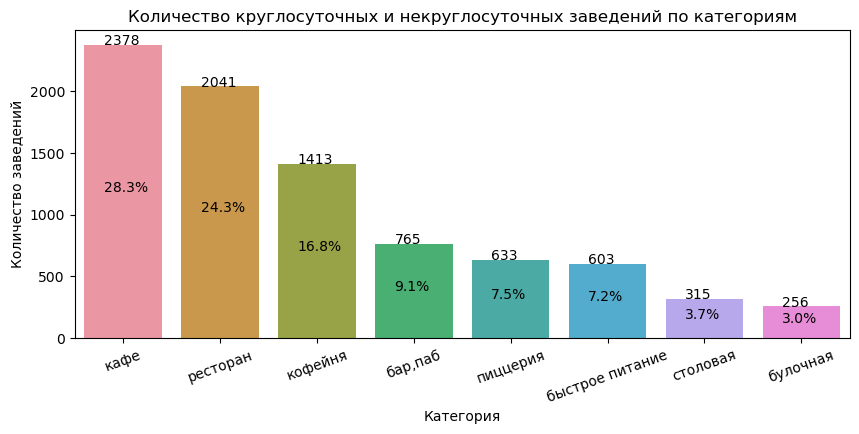

In [50]:
plt.figure(figsize=(10, 4))
ax = sns.barplot(x='category', y='count', data = category_count)
plt.title('Количество круглосуточных и некруглосуточных заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=20)
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/len(data['category']))
        x = p.get_x()+0.2
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))
        count = '{:.0f}'.format(p.get_height())
        x = p.get_x()+0.2
        y = p.get_y()+ p.get_height()
        ax.annotate(count, (x, y))
plt.show()

Доля ресторанов и кафе знаимет больше половины рынка. Можно предположить, что клиентов в заведении интересует не только еда, но и антураж, возможность приятно провести время, отхохнуть. Еще четверть рынка приходится на кофейни, бары и пабы, эти заведения специализируются на напитках, но при этом обычно антуражны и нацелены на долгое время припровождение. На пиццерии, быстрое питание, столовые и булочные приходится меньше четверти рынка, сюда люди чаще заглядывают ненадолго, с конкретной целью приобрести еду с собой, либо поесть на месте не тратя много времени.

### Анализ графика работы

Посмотрим как часто можно встретить круглосуточные заведения.

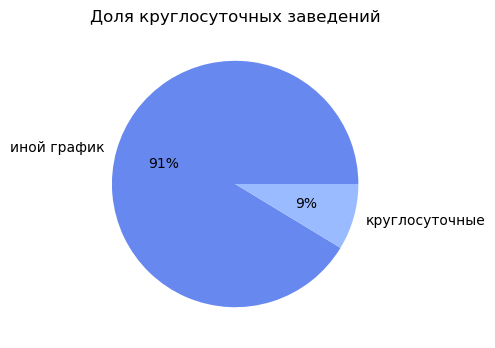

In [51]:
plt.figure(figsize = (4,4))
plt.pie(data.groupby('is_24/7')['name'].count(), labels = ['иной график','круглосуточные'], autopct='%.0f%%')
plt.title('Доля круглосуточных заведений')
plt.show()


In [52]:
is_24 = (data.groupby(['category','is_24/7'])
             .agg(count=('name','count'))
             .sort_values(by = ['count'], ascending = False)
             .reset_index())

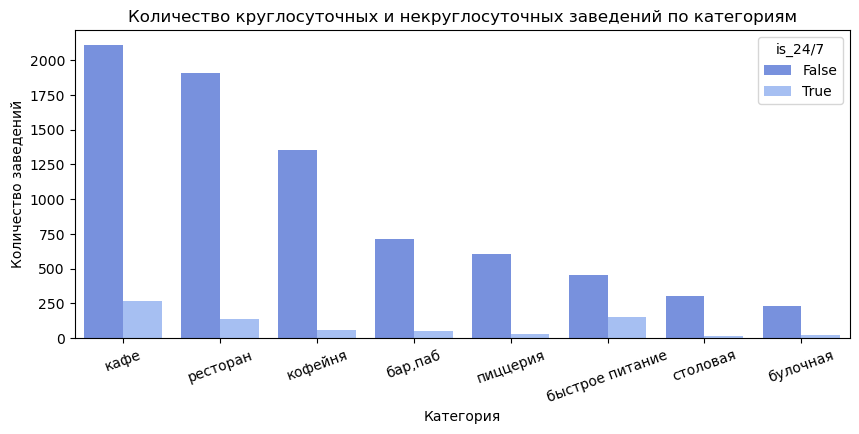

In [53]:
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='count', data=is_24, hue = 'is_24/7')
plt.title('Количество круглосуточных и некруглосуточных заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=20)
plt.show()


Круглосуточных заведений с разы меньше, чем с иным графиком. Больше всего круглосуточных кафе, однако это примено 10 часть от общего числа, Среди ресторанов быстрого питания круглосуточных примерно 5 часть.

### Анализ количества посадочных мест по категориям заведений.

Посмотрим как варьируются значения посадочных мест по категория.

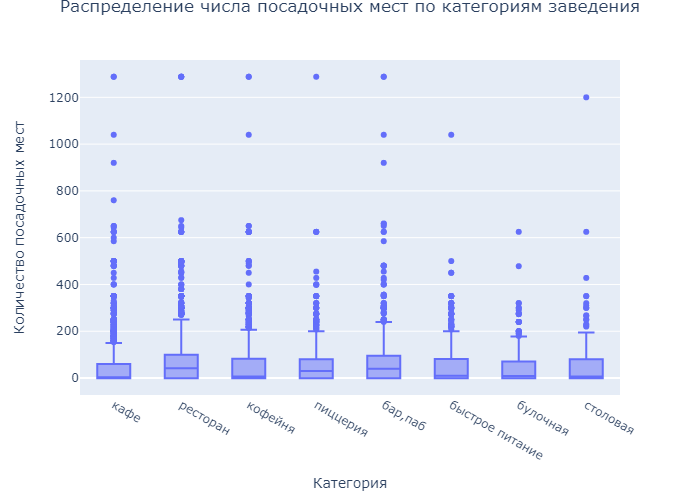

In [54]:
draw_box(data, 'category', 'seats', 'Распределение числа посадочных мест по категориям заведения',
         'Категория', 'Количество посадочных мест' )

На графике мы видим большое количество выбросов во всех категориях. Кафе, рестораны, быры, пабы и столовые могут иметь большое количество посадочных мест. А кофейни, пиццерии, заведения быстрого питания и булочные могут указывать количеством посадочных мест ,например, места в открытых зонах торговых центров. Без учета выбросов, наибольшее количество посадоччных мест у расторанов и баров. Наименьшее у кафе. Посмотрим как распределены медианные значения.

In [55]:
seats_median = (data.query('seats >= 0')
            .groupby('category')
            .agg(seats_median=('seats', 'median'))
            .sort_values(by='seats_median', ascending=True)
            .reset_index())
seats_median['seats_median'] = round(seats_median['seats_median'])

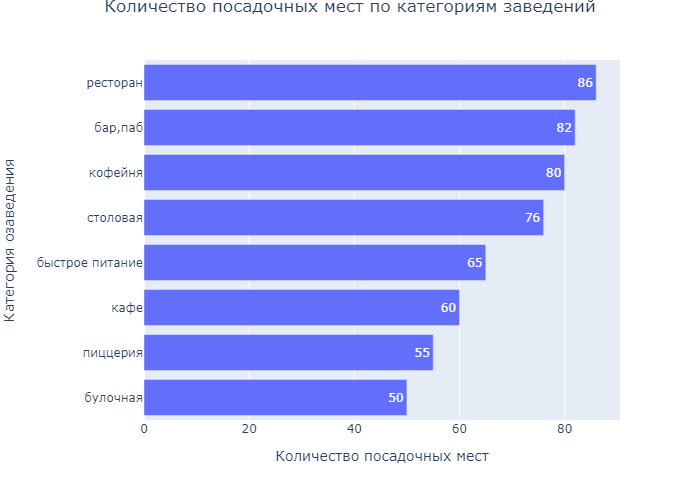

In [56]:
draw_bar(seats_median, 'seats_median', 'category', 'seats_median',
         'Количество посадочных мест по категориям заведений',
        'Количество посадочных мест', 'Категория озаведения')

Наибольшее медианное количество посадочных мест у ресторанов и пабов. Наименьшее у булочных.

### Соотношение сетевых и несетевых заведений 

Посмотрим каких заведений больше.

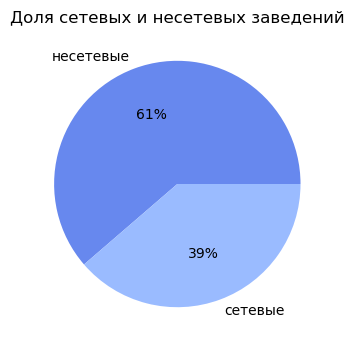

In [57]:
plt.figure(figsize = (4,4))
plt.pie(data.groupby('chain')['name'].count(), labels = ['несетевые','сетевые'], autopct='%.0f%%')
plt.title('Доля сетевых и несетевых заведений')
plt.show()


Несетевых заведений в 1.5 раза больше, чем сетевых. Посмотрим как распределены сетевые/несетевые по категориям.

In [58]:
chains_category = (data.groupby(['category', 'chain'], as_index = False)
              .agg(name_count=('name','count'))
              .sort_values(by = 'name_count', ascending = False))
chains_category['%_of_all'] = chains_category['name_count']/data['chain'].count()*100
chains_category

,category,chain,name_count,%_of_all
6,кафе,0,1586,18.871966
12,ресторан,0,1299,15.456925
7,кафе,1,792,9.424084
13,ресторан,1,742,8.829129
9,кофейня,1,726,8.638743
8,кофейня,0,687,8.174679
0,"бар,паб",0,595,7.079962
4,быстрое питание,0,367,4.366968
11,пиццерия,1,331,3.938601
10,пиццерия,0,302,3.593527


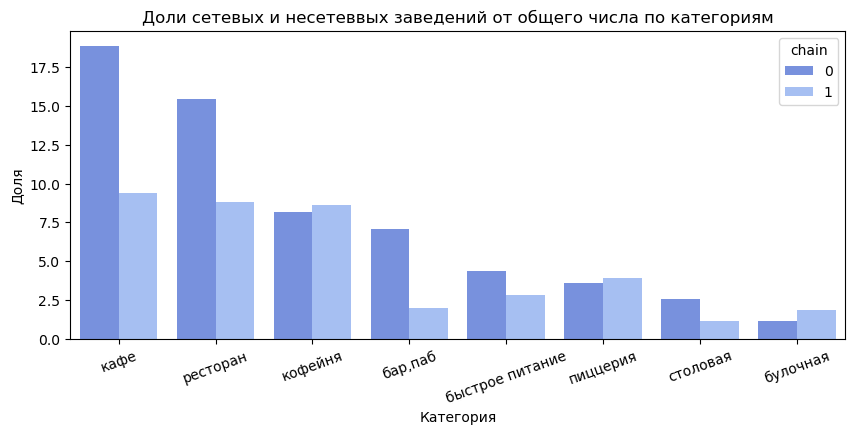

In [59]:
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='%_of_all', data=chains_category, hue = 'chain')
plt.title('Доли сетевых и несетеввых заведений от общего числа по категориям')
plt.xlabel('Категория')
plt.ylabel('Доля')
plt.xticks(rotation=20)
plt.show()

Сетевые заведения преобладают над несетевыми только в категориях кофейня, пиццерия и булочная.

#### Топ15 сетевых заведений

Посмотрим какие сети наиболее распространены в Москве.

In [60]:
chains = (data.query('chain == 1')
              .groupby('name', as_index = False)
              .agg(name_count=('name','count'),
                  categories = ('category','unique'))
              .sort_values(by = 'name_count', ascending = False))

chains['%_of_chains'] = round(chains['name_count']/data['chain'].sum()*100, 1)
chains['%_of_all'] = round(chains['name_count']/data['chain'].count()*100, 1)
big_chains = chains.head(15)
big_chains_names = big_chains['name'].values
print('Топ 15 крупных сетей занимают {0:.1f} %'.format(big_chains['%_of_all'].sum()))
print('Топ 15 крупных сетей занимают {0:.1f} %'.format(big_chains['%_of_chains'].sum()))
big_chains

Топ 15 крупных сетей занимают 9.8 %
Топ 15 крупных сетей занимают 25.2 %


,name,name_count,categories,%_of_chains,%_of_all
729,шоколадница,120,"[кофейня, кафе]",3.7,1.4
335,домино'с пицца,77,[пиццерия],2.4,0.9
331,додо пицца,74,[пиццерия],2.3,0.9
146,one price coffee,72,[кофейня],2.2,0.9
742,яндекс лавка,69,[ресторан],2.1,0.8
58,cofix,65,[кофейня],2.0,0.8
168,prime,50,"[ресторан, кафе]",1.5,0.6
664,хинкальная,44,"[быстрое питание, кафе, ресторан, столовая, бар,паб]",1.4,0.5
409,кофепорт,42,[кофейня],1.3,0.5
418,кулинарная лавка братьев караваевых,39,[кафе],1.2,0.5


Топ 15 крутных сетей занимаю 9.7% всего рынка и 25.2% рынка сетевых заведений. Сеть "шоколадница" занимает 3.7% среди сетевых заведений и 1.4% от всех заведений Москвы. Му-му закрывает топ-15, заведение представлено в 7 категориях. 

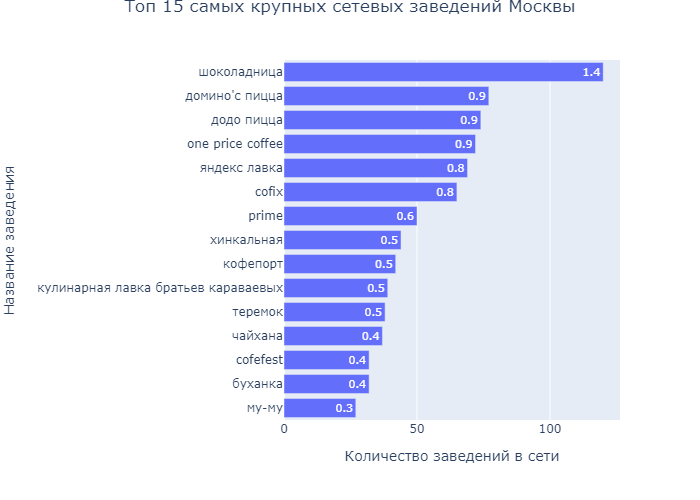

In [61]:
draw_bar(big_chains.sort_values(by = 'name_count', ascending = True),
         'name_count', 'name', '%_of_all',
         'Топ 15 самых крупных сетевых заведений Москвы',
        'Количество заведений в сети', 'Название заведения')

Посмотрим как распределены заведения из топ 15 по округам.

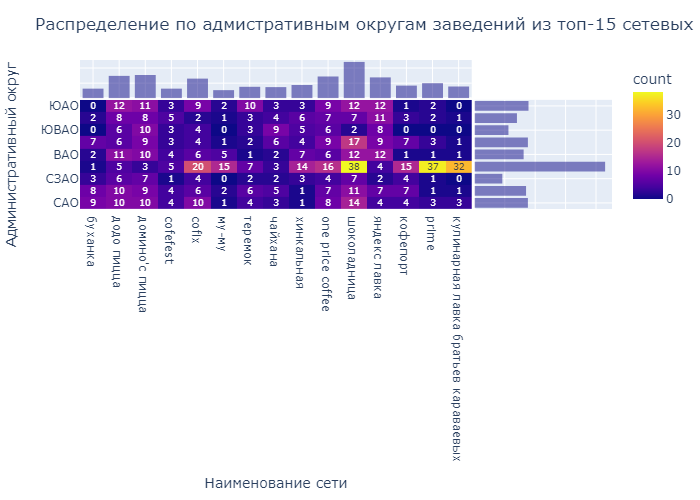

In [62]:
draw_heatmap(data.query("name in @big_chains_names"), 'name', 'district_shot',
            'Распределение по адмистративным округам заведений из топ-15 сетевых',
            'Наименование сети', 'Административный округ')

Больше всего сетевых заведений находятся в центральном округе. В юго-восточном, южном  и северо-западном округах некоторые из крупнейших сетей совсем отсутствуют. Некоторые сети чаще встречаются не в центральном округе, например, яндекс лавка,буханка, додо пицца, домино'с пицца имеют меньшее количество заведений в ЦАО относительно других округов. Очевидно, что конкуренция и издержки в центральном округе выше.

Посмотрим как распределены категории заведений из топ-15 сетей по округам.

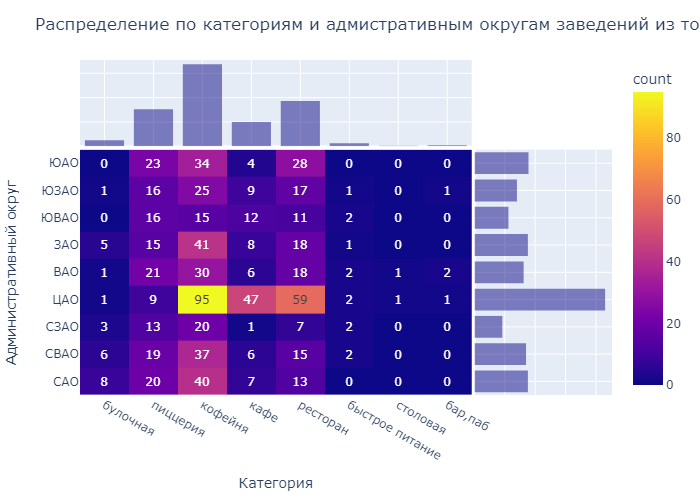

In [63]:
draw_heatmap(data.query("name in @big_chains_names"), 'category', 'district_shot',
            'Распределение по категориям и адмистративным округам заведений из топ-15 сетевых',
            'Категория', 'Административный округ')

Наибольшее количество заведений среди топ-15 сетевых - кофейни, чаще всего они расположены в центральном округе Москвы, но в целом их много во всех округах. В ЦАО также много кафе и ресторанов, а пиццерии в основном раположены не в ЦАО. Меньше всего баров/пабов и столовых.

### Распределение по категориям и районам всех заведений.

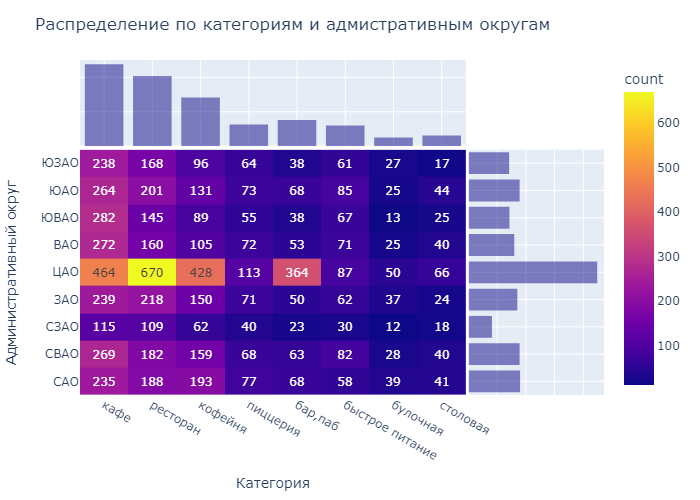

In [64]:
draw_heatmap(data, 'category', 'district_shot',
            'Распределение по категориям и адмистративным округам',
            'Категория', 'Административный округ')

Больше всего заведений расположено в ЦАО. Меньше всего в СЗАО. В остальных округах примерно одинаковое количество заведений, их количество варьируется по категориям. Среди категорий больше всего ресторанов, на втором месте кафе и на третьем кофейня. Меньше всего булочных и столовых.

### Распределение  рейтингов по категориям

Сгруппируем данные по категориям и посмотрим на средний и медианнный рейтинги.

In [65]:
mean_rating = (data.groupby('category')
               .agg(median=('rating','median'), mean=('rating', 'mean'))
               .sort_values(by = 'mean', ascending = True)
               .reset_index())
mean_rating['mean'] = round(mean_rating['mean'],2)
mean_rating

,category,median,mean
0,быстрое питание,4.2,4.05
1,кафе,4.2,4.12
2,столовая,4.3,4.21
3,булочная,4.3,4.27
4,кофейня,4.3,4.28
5,ресторан,4.3,4.29
6,пиццерия,4.3,4.30
7,"бар,паб",4.4,4.39


Средние рейтинги либо совпадают с медианой, либо чуть ниже, в таких категориях явно есть несколько заведений с пониженным рейтингом.

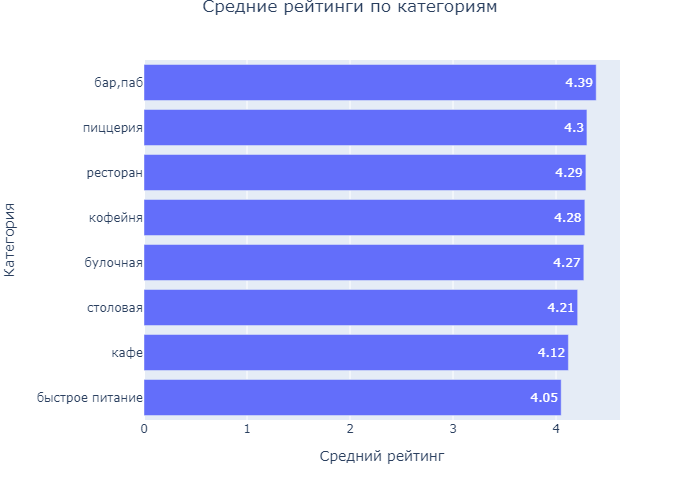

In [66]:
draw_bar(mean_rating, 'mean', 'category', 'mean',
         'Средние рейтинги по категориям', 'Средний рейтинг', 'Категория')

Самый низкий средний рейтинг у заведений быстрого питания 4.05. Самый всокий у баров/пабов 4.39.

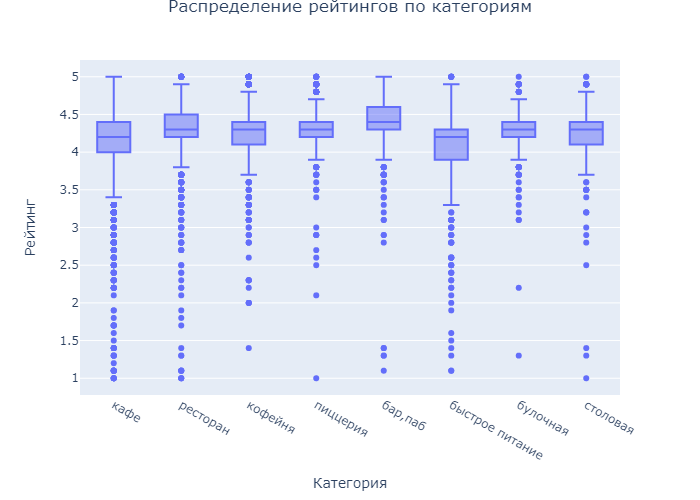

In [67]:
draw_box(data, 'category', 'rating', 'Распределение рейтингов по категориям', 'Категория', 'Рейтинг' )

Если смотреть по всем данным, то рейтинги баров/пабов выше, чем у остальных категории и имею меньше выбросов с низкими оценками. У заведений быстрого питания самый низкий 75% квартиль, медиана а также много выбросов с низкими оценками. Основная масса оценок во всех категориях, кроме быстрого питания выше 4.

#### Картограмма рейтингов

In [68]:
draw_choropleth(data, 'rating', 'mean', 'Средний рейтинг заведений по административным округам Москвы' )

Самый высокий средний рейтинг приходится на центральный административный округ, этот округ наиболее интересен туристам, интересен для прогулок, поэтому в нём расположено больше интересных заведений с качественным сервисом. Самый низкий средний рейтинг в юго-воточном округе.

### Картограмма расположения заведений.

In [69]:
draw_choropleth(data, 'name', 'count', 'Количество заведений по административным округам Москвы', claster = 1)

Cамое большое число заведений в центре. Меньше всего с северо-западном, юго-западном и юго-восточном округах.

### Топ 15 улиц с самым большим количеством заведений

In [70]:
streets = (data.groupby('street', as_index = False)
               .agg(count_name = ('name','count'),district = ('district_shot', 'unique'))
               .sort_values(by = 'count_name', ascending = False))
streets['%_of_all'] = round(streets['count_name']/len(data)*100, 1)
top_streets = streets.head(15)
print('На топ 15 улиц с наибольшим количеством заведений разположено {0:.1f} % всех заведений'\
      .format(big_chains['%_of_all'].sum()))
top_street = top_streets['street']
top_streets

На топ 15 улиц с наибольшим количеством заведений разположено 9.8 % всех заведений


,street,count_name,district,%_of_all
1090,проспект Мира,184,"[СВАО, ЦАО]",2.2
773,Профсоюзная улица,122,[ЮЗАО],1.5
1087,проспект Вернадского,108,"[ЗАО, ЮЗАО]",1.3
525,Ленинский проспект,107,"[ЦАО, ЮЗАО, ЮАО, ЗАО]",1.3
523,Ленинградский проспект,95,[САО],1.1
373,Дмитровское шоссе,88,"[САО, СВАО]",1.0
298,Варшавское шоссе,76,[ЮАО],0.9
455,Каширское шоссе,76,[ЮАО],0.9
524,Ленинградское шоссе,70,[САО],0.8
550,МКАД,65,"[САО, СВАО, СЗАО, ВАО, ЗАО, ЮВАО, ЮЗАО, ЮАО]",0.8


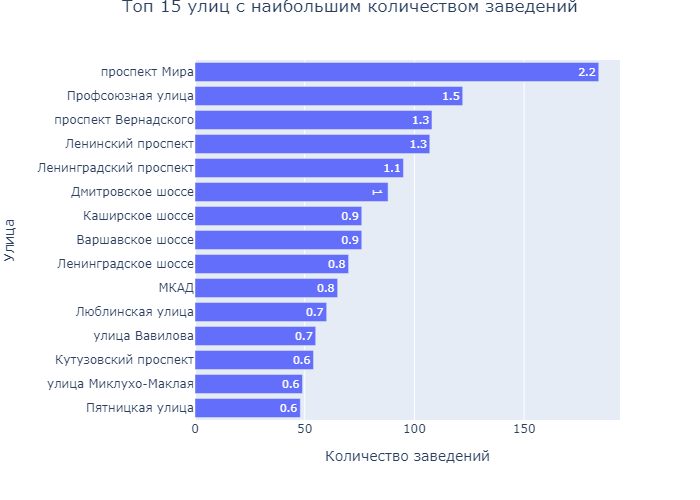

In [71]:
draw_bar(top_streets.sort_values(by = 'count_name'), 'count_name', 'street', '%_of_all',
         'Топ 15 улиц с наибольшим количеством заведений',
        'Количество заведений', 'Улица')

Наибольшее количество заведений расположено на крупных улицах, некоторые из них проходят через несколько административных округов. На многих улицах рапсоложены ТЦ с множетсвом заведений в фудкорт зонах. Самое большое количество заведений 184 на проспекте Мира, в том числе это обусловлено тем, что там находится парк ВДНХ. Улица Миклухо Маклая хоть и не большая, но там находится студенческий городок. Пятницкая улица является основной туристической прогулочной зоной в центре Москвы. МКАД имеет наибольшую протяженность, за счет этого он попадает в топ.

Посмотрим как распределены категории заведений на топ 15 улицах.

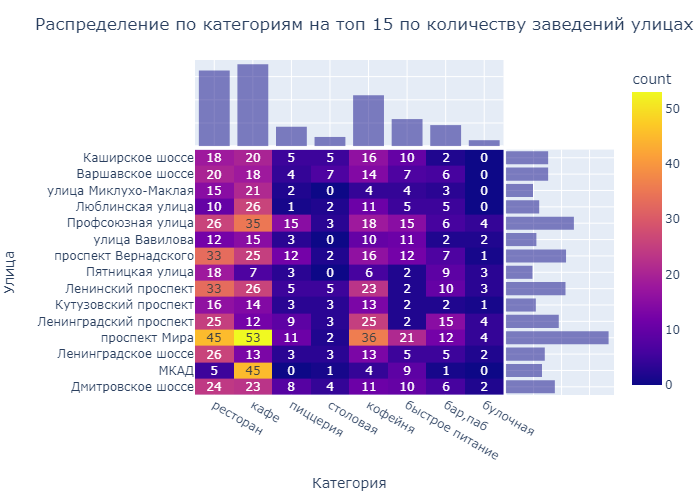

In [72]:
draw_heatmap(data.query("street in @top_street"), 'category', 'street',
            'Распределение по категориям на топ 15 по количеству заведений улицах',
            'Категория', 'Улица')

На топ-15 улицах чаще всего встречаются кафе и рестораны. Реже всего булочные и столовые. Кофейни на третьем месте. 

### Улицы с одним заведением

In [73]:
print(f'Количество улиц, на которых заведение единственное: {len(less_streets)}')
print('Доля улиц с единственным заведением: {0:.2f}'.format(len(less_streets)/data["street"].nunique()))

Количество улиц, на которых заведение единственное: 458
Доля улиц с единственным заведением: 0.32


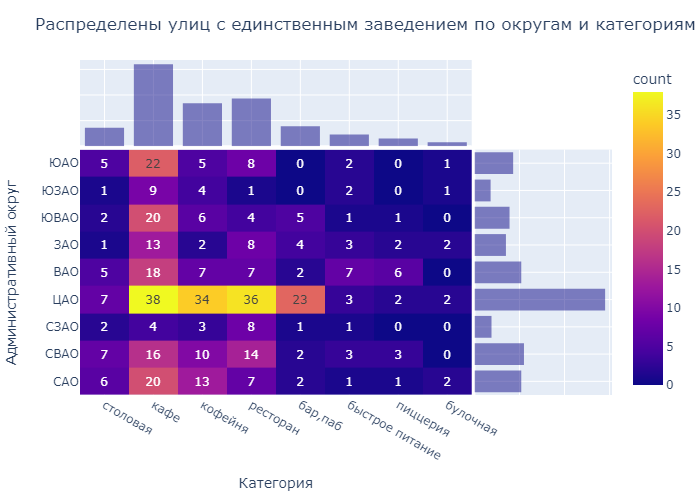

In [74]:
draw_heatmap(data.query("one_on_street == 1"), 'category', 'district_shot',
            'Распределены улиц с единственным заведением по округам и категориям',
            'Категория', 'Административный округ')

Больше всего улиц с единственным заведением находятся в центре, это можно объяснить тем фактом, что в центре множество маленьких улиц. В основном единственным заведением на улице является кафе.

Посмотрим насколько различаются средние рейтинги, средний чек и средняя стоимость чашки капучинно по категориям в единственных на улице заведениях и не единственных. 

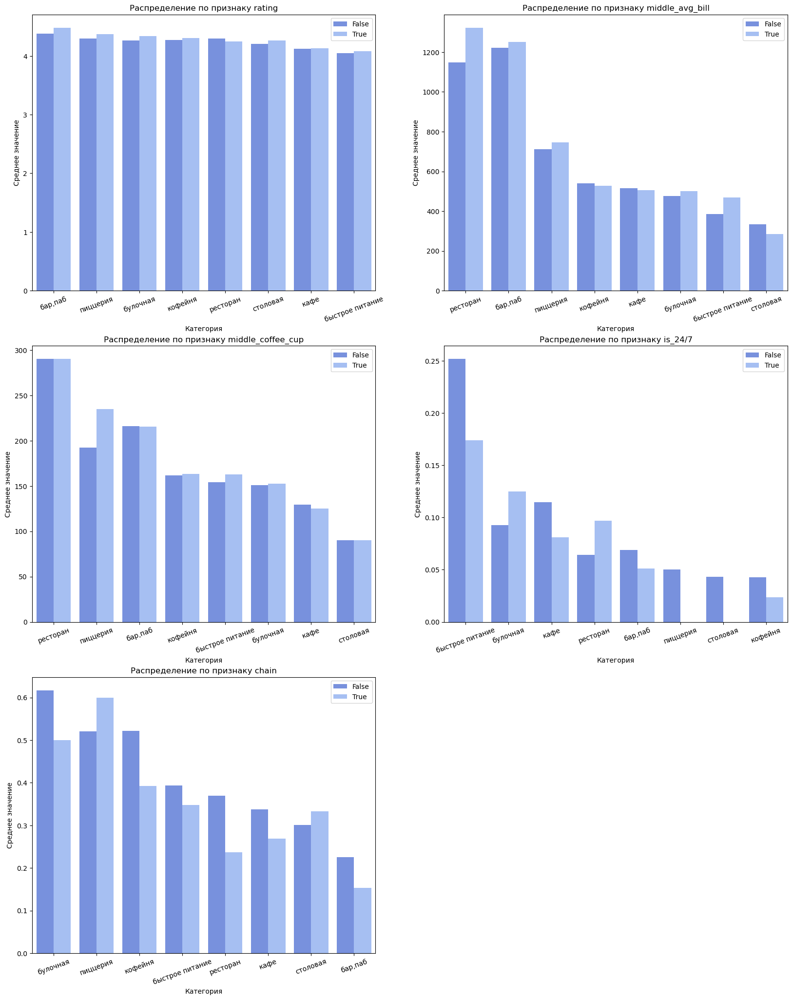

In [75]:
fig, ax = plt.subplots(figsize =(20,25))
j = 0
for col in ('rating','middle_avg_bill','middle_coffee_cup','is_24/7', 'chain'):
    ax = plt.subplot(3,2,j+1)
    sns.barplot(x='category',
            y=col,
            data=(data.groupby(['category', 'one_on_street'], as_index = False)[[col]].mean()
                  .sort_values(by=col, ascending = False)),
            hue='one_on_street')
    plt.title(f'Распределение по признаку {col}')
    plt.xlabel('Категория')
    plt.xticks(rotation=20)
    plt.ylabel('Среднее значение')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    j+=1

Сравнив средние значения для единственных на улице заведений и не едиственных, можно сказать следующее:
    
    1. средние рейтинги у единственных на улице заведений чуть выше во всех категориях, кроме ресторанов. Чаще всего, когда заведение одно на улице, его посещают местные жители, за счет этого создается более уютная атмосфера, за счет этого может быть повышен рейтинг.
    2. средний чек ниже в кофейнях, кафе и столовых.
    3. средняя стоимость чашки капучинно выше в пиццериях, быстром питании и булочных, ниже в кафе, в остальных категориях практически не отличается. 
    4. рестораны и булочные чаще бывают круглосуточными, если они единственные на улице. Круглосуточных пиццерий и столовых, если они единственные на улице в данных нет.
    5. среди сетевых заведений чаще бывают единственными на улице пиццерии и столовые.

### Анализ средних чеков

Посмотрим как коррелируются между собой удаленность от центра и средний чек.

In [76]:
data[['distance','middle_avg_bill']].corr()

,distance,middle_avg_bill
distance,1.000000,-0.252279
middle_avg_bill,-0.252279,1.000000


Коэффициент корреляции составляет -0.25, можно говорить о слабой отрицательной взаимосвязи между средним чеком и удаленностью от центра, скорее всего есть и другие факторы оказывающие влияние на средний чек. Значения среднего чека могут варьироваться не только в зависимости от удаленности. Построим хороплет медианного среднего чека по административным округам.

In [77]:
draw_choropleth(data, 'middle_avg_bill', 'median', 'Медианный средний чек заведений по административным округам Москвы')

В центральном округе действительно самый высокий средний чек, на втором месте западный административный округ. Мы видим что в северо-восточной части города средний чек ниже, чем в юго-западной. Значит на средний чек влияет не только удаленность, но и округ.

### Вывод

Больше половины рынка заведений общественного питания Москвы занимают кафе(28.3%) и рестораны(24.3%). Кофейни на 3 месте занимают 16.8% рынка. Наименьшую долю 3.05% занимают булочные. 
Круглосуточных заведений всего 9%, больше всего кафе, но наибольшая часть заведений круглосуточные в категории быстрого питания, примернот 20%.

Исходя из медианного числа посадочным мест, наибольшее могут предложить рестораны, бары/пабы и кофейни. Однако среди всех категорий заведений можно встретить большое количество посадочных мест, стоит учитывать, что это могут быть фудкортные зоны ТЦ.

Несетывыми являются 61% заведений, в равзере категорий сетевые преобладают лишь среди кофеен(на 0.5% от общего рынка больше сетевых), пиццерий(на 0.3%) и булочных(0.7%). Несетевых кафе и реторанов вдвое больше, чем сетевых.

Самой крупной сетью в Москве является Шоколадница (120 заведений), она представлена в двух категориях кафе и кофейня и занимает 3.6% ранка сетевых заведений и 1.5% всего рынка.

Средний чек имеет слабую корреляцию с отдаленностью от центра, в западной части города средний чек выше, чем в восточной.

Самое большое количество заведений расположено в центральном административном округе(ЦАО), на общих данных преобладают рестораны, среди сетевых кофейни. В центре самый высокий средний чек, средний рейтинг заведений и больше всего улиц с единственным заведением. В рейтинг топ15 улиц с самым большим количеством заведений попала Пятницкая улица, расположенная в ЦАО, на ней находится 48 заведений.

Меньше всего заведений расположено в северо-западном административном округе(СЗАО) при этом по среднему рейтингу округ занимет 3 место. Также в СЗАО меньше всего улиц с единственным заведением. Среди сетевых заведений там чаще всего встречаются кофейни, пообщим данным рестораны. По среднему чеку округ делит третье место по Москве совместно с юго-западным и южным округами.

Северный административный округ(САО) на втором месте по количеству заведений и по среднему рейтингу, но по среднему чеку он делит последнее место со всеми восточными округами.

Самый низкий средний рейтинг заведений в юго-воточном административном округе(ЮВАО), по количеству заведений он занимает 7 место.

Чаще всего много заведений расположено на крупных улицах, шоссе и проспектах, на них часто расположены крупные ТЦ с фудкорт зоной. В топ 15 попал и МКАД за счёт своей протяженности. Самое большое число заведений на проспекте Мира (184), он проходит через 2  админитративных округа. Из небольших улиц в топ 15 попали Пятницкая (пешеходная улица в центре) и Миклухо-Маклая со студенческим городком на юго-западе. 

В данных представлено 458 улиц с единственным заведением (32 процента количества улиц в данных). На таких улицах чаще встречаются круглосуточные рестораны и булочные. У заведения на таких улицах чуть выше средний рейтинг во всех категориях, кроме ресторанов, ниже средний чек в категориях рестораны, кафе и кофейни.

Рекомендации по открытию заведения:

    для открытия точки общественного питания стоит рассматривать западную часть города, там можно расчитывать на более высокий средний чек;
    Северо-западный и юго-западный округи не перенасыщены заведениями, в том числе сетевыми;
    не стоит выбирать улицы с одним заведением, привыкшие к нему люди, не всегда будут готовы к новому, а поток людей скорее всего ограничен;
    стоит рассмотреть вариант с открытием круглосуточного заведения;
    по категориям стоит обратить внимание на бар/паб или кофейню, они занимают четверть рынка, то есть интересны людям, но рынок ими не перенасыщен.





## Детализация исследования: открытие кофейни

На основании заинтересованности инвесторов проведём детальный анализ открытия кофейни.

Отберем данные по кофейням в переменную `coffee_place`

In [78]:
coffee_place = data.loc[data['category']=='кофейня']
print(f'Всего наблюдений по кофейням: {len(coffee_place)},\
 что составляет {round(len(coffee_place)/len(data)*100)} % наблюдений')

Всего наблюдений по кофейням: 1413, что составляет 17 % наблюдений


### Расположение кофеен на карте.

In [79]:
draw_choropleth(coffee_place, 'name', 'count', 'Количество кофеен по административным округам Москвы', claster = 1)

Больше всего кофеен в центре города. Не перенасыщены кофейнями северо-западный, юго-западный, востоный и юго-восточный округа. Скопление кофеен можно наблюдать вдоль крупных улиц, станций метро и в ТЦ. 

In [80]:
print(coffee_place['street'].nunique(), coffee_place['street'].nunique()/data['street'].nunique())

629 0.43439226519337015


Кофейни встречаются на 629 улицах, что сотавляет 43% всех улиц в полном датасете. 

### Распределение сетей по районам

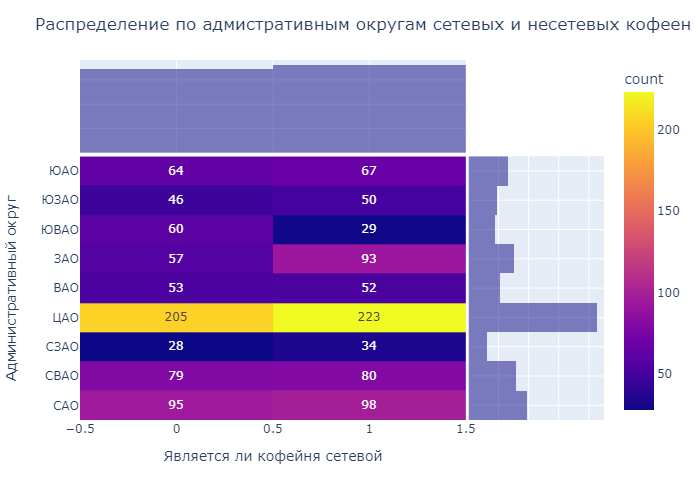

In [81]:
draw_heatmap(coffee_place, 'chain', 'district_shot',
            'Распределение по адмистративным округам сетевых и несетевых кофеен',
            'Является ли кофейня сетевой', 'Административный округ')

В центре примерно поровну сетевых и несетевых кофеен. В юго-восточном и восточном округах сетевых кофеен меньше, чем несетевых. Посмотрим в каких районах присутствуют круглосуточные кофейни.

### Наличие круглосуточно работающих кофеен

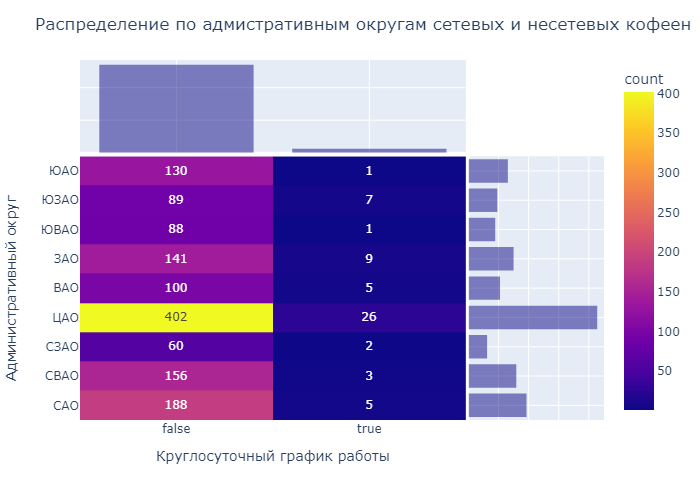

In [82]:
draw_heatmap(coffee_place, 'is_24/7', 'district_shot',
            'Распределение по адмистративным округам сетевых и несетевых кофеен',
            'Круглосуточный график работы', 'Административный округ')

Круглосуточно работающих кофеен мало, даже в ЦАО, в нём их всего около 5%.

In [83]:
len(coffee_place.loc[coffee_place['is_24/7']==True])/len(coffee_place)

0.04175513092710545

Всего круглосуточных кофеен 4%. Круглосуточную кофейню имеет смысл открывать возле АЗС, ж/д вокзалов и на вылетных магистралях, то есть в местах, где люди достаточно часто могут оказаться ночью.

### Рейтинги

Посмотрим как распределены рейтинги по округам.

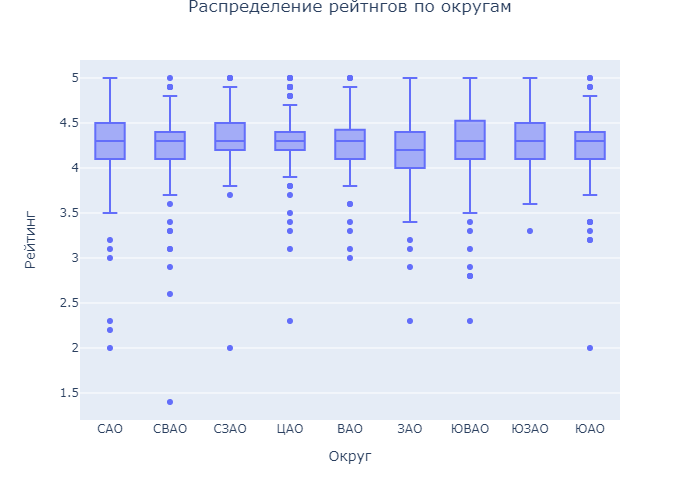

In [84]:
draw_box(coffee_place, 'district_shot', 'rating',
         'Распределение рейтнгов по округам', 'Округ', 'Рейтинг')

Во всех округах медианный рейтинг составляет 4.3, кроме западного, здесь он чуть ниже 4.2. Если ориентироваться на 75% персентиль, его уровень чуть ниже в ЗАО, ЦАО и СВАО, на уровне 4.7. Наиболее стабильные оценки в юго-западном округе, всего один выброс на уровне 3.3. Найдём список улиц на которых расположена одна кофейня, с рейтингом меньше 4 и выведем на карте.

In [85]:
less_rating = list(coffee_place.groupby('street')
               .agg(count=('name','count'), rating_mean=('rating', 'median'))
               .query('rating_mean<4 and count == 1 ').reset_index()['street'])

In [86]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        ).add_to(marker_cluster)
coffee_place.query('street in @less_rating').apply(create_clusters, axis=1)
m    

Мы отметили 34 кофейни, единственные на улице и имеющие рейтинг ниже 4. Можно рассмотреть вариант открытия кофейни неподалёку, если рейтинг есть, значит люди заинтересованы в заведении и можно продемонстрировав более высокий уровень сервиса переманить к себе клиентов.

### Средняя стоимость чашки капучино

In [87]:
print(round(coffee_place['middle_coffee_cup'].median()), round(coffee_place['middle_coffee_cup'].mean()))

158 162


Медианная стоимость чашки капучино 158 рублей, средняя 162 рубля. Разброс не большой. Посмотрим как варьируютс цены по округам.

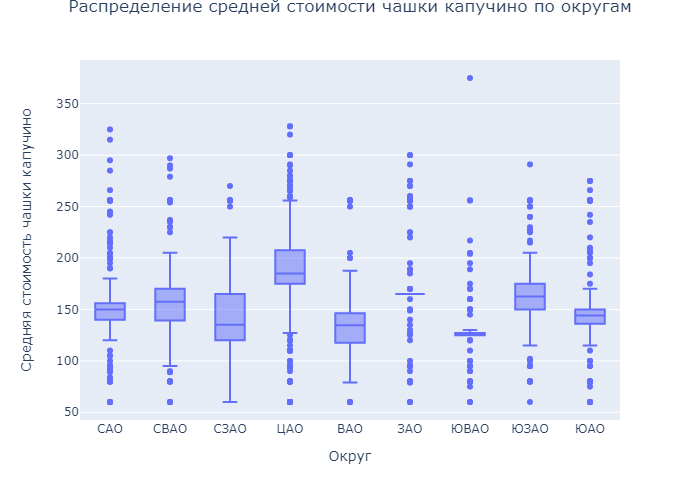

In [88]:
draw_box(coffee_place, 'district_shot', 'middle_coffee_cup',
         'Распределение средней стоимости чашки капучино по округам', 'Округ', 'Средняя стоимость чашки капучино')

Максимальная цена в ЗАО 375 рублей. Средняя цена в центе выше, чем в остальных округах. В западном и юго-восточном округах цены очень сильно варьируются, ящик с усами практически не формируется. Можно ориентироваться на среднюю цену в промежутке от 115 до 210 рублей в зависимости от округа.

### Вывод

В представленных данных 1413 кофеен, что составляет 17% от всего рынка. Они расположены на 43% улиц, которые есть в данных.
Наиболее заполнен кофейнями центральный округ, примерно половину расположенных в нём кофеен составляют сетевые. ЦАО в целом перенасыщен заведениями общественного питания, его не стоит рассматривать для открытия нового заведения.

Круглосуточных кофеен всего 4%, если рассматривать открытие круглосуточной кофейни, лучше ориентироваться на места, где есть ночной поток людей, вроде АЗС, вылетных авто и ж/д магистралей.

Недостаток кофеен заметен в северо-западном, юго-западном, восточном и юго-восточном. Меньше всего сетевых заведений в процентном соотношении в юго-восточном округе, но в нём наиболее стабильный высокий рейтинг.

Медианные рейтинги одинаковы во всех округах и равны 4.3, единственное исключение западный округ, медиана 4.2. Самые стабильные рейтинги в юго-западном округе. В остальных округах присутствует достаточное количество выбросов с низкими оценками.

Средняя цена чашки капучино варьируется в зависимости от округа. При планировании открытия можно ориентироваться на среднюю цену в 160 рублей.

## Ссылка на презентацию

https://cloud.mail.ru/public/idrp/3JuxybZoG